# Computational Linear Algebra: PCA Homework

## Initialization:
Fill the missing values in this text box and in the following code-cell.

**Academic Year:** 2024/2025

### Team Members (Alphabetical Order):
1. Bracciale, Riccardo (338616);
2. Brigante, Paolo (349553).

In [39]:
from random import random


StudentID1 = 349553  # <-------- Fill in the missing value
StudentID2 = 338616  # <-------- Fill in the missing value

## Starting Code-Cell 
### Attention: DO NOT CHANGE THE CODE INSIDE THE FOLLOWING CELL!

In [40]:
####################################################################
############## DO NOT CHANGE THE CODE IN THIS CELL #################
####################################################################

import numpy as np

var_entertainment_feat_types = ['Interests', 'Movies', 'Music']
var_personal_feat_types = ['Finance', 'Phobias']
fixed_feat_types = ['Personality', 'Health']

label_types = ['Demographic']

variables_by_type = {
    'Demographics': ['Age', 'Height', 'Weight', 'Number of siblings', 
                     'Gender', 'Hand', 'Education', 'Only child', 'Home Town Type',
                     'Home Type'],
    'Finance': ['Finances', 'Shopping centres', 'Branded clothing', 
                'Entertainment spending', 'Spending on looks', 
                'Spending on gadgets', 'Spending on healthy eating'],
    'Health': ['Smoking', 'Alcohol', 'Healthy eating'],
    'Interests': ['History', 'Psychology', 'Politics', 'Mathematics', 
                  'Physics', 'Internet', 'PC', 'Economy Management', 
                  'Biology', 'Chemistry', 'Reading', 'Geography', 
                  'Foreign languages', 'Medicine', 'Law', 'Cars', 
                  'Art exhibitions', 'Religion', 'Countryside, outdoors', 
                  'Dancing', 'Musical instruments', 'Writing', 'Passive sport', 
                  'Active sport', 'Gardening', 'Celebrities', 'Shopping', 
                  'Science and technology', 'Theatre', 'Fun with friends', 
                  'Adrenaline sports', 'Pets'],
    'Movies': ['Movies', 'Horror', 'Thriller', 'Comedy', 'Romantic', 
               'Sci-fi', 'War', 'Fantasy/Fairy tales', 'Animated', 
               'Documentary', 'Western', 'Action'],
    'Music': ['Music', 'Slow songs or fast songs', 'Dance', 'Folk', 
              'Country', 'Classical music', 'Musical', 'Pop', 'Rock', 
              'Metal or Hardrock', 'Punk', 'Hiphop, Rap', 'Reggae, Ska', 
              'Swing, Jazz', 'Rock n roll', 'Alternative', 'Latino', 
              'Techno, Trance', 'Opera'],
    'Personality': ['Daily events', 'Prioritising workload', 
                    'Writing notes', 'Workaholism', 'Thinking ahead', 
                    'Final judgement', 'Reliability', 'Keeping promises', 
                    'Loss of interest', 'Friends versus money', 'Funniness', 
                    'Fake', 'Criminal damage', 'Decision making', 'Elections', 
                    'Self-criticism', 'Judgment calls', 'Hypochondria', 
                    'Empathy', 'Eating to survive', 'Giving', 
                    'Compassion to animals', 'Borrowed stuff', 
                    'Loneliness', 'Cheating in school', 'Health', 
                    'Changing the past', 'God', 'Dreams', 'Charity', 
                    'Number of friends', 'Punctuality', 'Lying', 'Waiting', 
                    'New environment', 'Mood swings', 'Appearence and gestures', 
                    'Socializing', 'Achievements', 'Responding to a serious letter', 
                    'Children', 'Assertiveness', 'Getting angry', 
                    'Knowing the right people', 'Public speaking', 
                    'Unpopularity', 'Life struggles', 'Happiness in life', 
                    'Energy levels', 'Small - big dogs', 'Personality', 
                    'Finding lost valuables', 'Getting up', 'Interests or hobbies', 
                    "Parents' advice", 'Questionnaires or polls', 'Internet usage'],
    'Phobias': ['Flying', 'Storm', 'Darkness', 'Heights', 'Spiders', 'Snakes', 
                'Rats', 'Ageing', 'Dangerous dogs', 'Fear of public speaking']
}

labels = variables_by_type['Demographics']

try:
    random_seed = min([StudentID1, StudentID2])
except NameError:
    random_seed = StudentID1

def which_featgroups():
    np.random.seed(random_seed)
    these_entertainments = np.random.choice(var_entertainment_feat_types, 2, replace=False).tolist()
    these_personal = np.random.choice(var_personal_feat_types, 1, replace=False).tolist()
    these_types = fixed_feat_types + these_personal + these_entertainments
    print('*** THESE ARE THE SELECTED TYPE OF VARIABLES:')
    for k in these_types:
        print(f'{k}')
    print('*************************************')
    return these_types

def which_features(these_types):
    np.random.seed(random_seed)
    these_features = []
    for type in these_types:
        if type != 'Personality':
            these_features += variables_by_type[type]
        else:
            these_features += np.random.choice(variables_by_type[type], 
                                               int(2 * (len(variables_by_type[type]) / 3)), 
                                               replace=False).tolist()
    print('*** THESE ARE THE SELECTED FEATURES:')
    for ft in these_features:
        print(f'{ft}')
    print('*************************************')
    return these_features

these_types = which_featgroups()
these_features = which_features(these_types)

np.random.seed(random_seed)

*** THESE ARE THE SELECTED TYPE OF VARIABLES:
Personality
Health
Finance
Movies
Interests
*************************************
*** THESE ARE THE SELECTED FEATURES:
Thinking ahead
Mood swings
God
Compassion to animals
Getting angry
Elections
Questionnaires or polls
Appearence and gestures
Daily events
Public speaking
Small - big dogs
New environment
Hypochondria
Internet usage
Friends versus money
Funniness
Achievements
Energy levels
Lying
Responding to a serious letter
Reliability
Happiness in life
Dreams
Parents' advice
Number of friends
Children
Workaholism
Cheating in school
Waiting
Keeping promises
Decision making
Punctuality
Interests or hobbies
Unpopularity
Getting up
Health
Writing notes
Prioritising workload
Smoking
Alcohol
Healthy eating
Finances
Shopping centres
Branded clothing
Entertainment spending
Spending on looks
Spending on gadgets
Spending on healthy eating
Movies
Horror
Thriller
Comedy
Romantic
Sci-fi
War
Fantasy/Fairy tales
Animated
Documentary
Western
Action
Histo

## Importing Modules

In the following cell, import all the modules you think are necessary for doing the homework, **among the ones listed and used during the laboratories of the course**.
No extra modules are allowed for reproducibility.

In [41]:
# DO NOT IMPORT NUMPY
import pandas as pd
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.decomposition import PCA
from matplotlib import pyplot as plt


## Exercise 1. Preparing the Dataset

In the cells below, do the following operations:
1. load the dataset "_responses_hw.csv_";
2. create a working dataframe extracting from _responses_hw.csv_ the columns corresponding to the variables in _these_features_, and randomly selecting 2/3 of the rows. Let us call this dataframe _X_df_;
3. analyze the obtained dataframe and performing cleansing/encoding operations.

In [42]:
# 1.1 Load the dataset
file_path = "responses_hw.csv"
responses_df = pd.read_csv(file_path)

# 1.2 Create a dataframe extracting the selected features and randomly sample 2/3 of the rows. 
X_df = responses_df.copy()\
        .sample(frac=2/3, random_state=random_seed)[these_features]




In [43]:

num_rows_with_missing_values = X_df.isnull().any(axis=1).sum()


num_missing_values_per_feature = X_df.isnull().sum()

print(f"Total number of rows: {X_df.shape[0]}")
print(f"Number of elements with at least a missing value: {num_rows_with_missing_values}")


print("Number of missing values per feature:")
display(num_missing_values_per_feature[num_missing_values_per_feature > 0].sort_values(ascending=False))




Total number of rows: 673
Number of elements with at least a missing value: 158
Number of missing values per feature:


Passive sport            8
Chemistry                8
Compassion to animals    7
Geography                7
Documentary              6
                        ..
History                  1
Law                      1
Musical instruments      1
Shopping                 1
Celebrities              1
Length: 83, dtype: int64

In [44]:
print(pd.DataFrame(X_df.dtypes.value_counts()))
print()

print(f"There are {X_df.select_dtypes(include=['object']).shape[1]} categorical features and {X_df.select_dtypes(exclude=['object']).shape[1]} numerical features.")
print()
# Show features with categorical values
categorical_features = X_df.select_dtypes(include=['object']).columns
for feature in categorical_features:
    print(f"Feature '{feature}' has {X_df[feature].nunique()} unique values:")
    display(pd.DataFrame(X_df[feature].value_counts()))
    print()


         count
float64     84
object       5
int64        3

There are 5 categorical features and 87 numerical features.

Feature 'Internet usage' has 4 unique values:


,count
Internet usage,
few hours a day,507
less than an hour a day,87
most of the day,77
no time at all,2



Feature 'Lying' has 4 unique values:


,count
Lying,
sometimes,366
only to avoid hurting someone,172
everytime it suits me,99
never,35



Feature 'Punctuality' has 3 unique values:


,count
Punctuality,
on time,256
early,222
late,193



Feature 'Smoking' has 4 unique values:


,count
Smoking,
tried smoking,284
never smoked,140
current smoker,128
former smoker,116



Feature 'Alcohol' has 3 unique values:


,count
Alcohol,
social drinker,432
drink a lot,156
never,83


In [45]:
X_df = X_df.dropna()


internet_usage_order = {
    "no time at all": 0,
    "less than an hour a day": 1,
    "few hours a day": 2,
    "most of the day": 3
}

lying_order = {
    "never": 0,
    "only to avoid hurting someone": 1,
    "sometimes": 2,
    "everytime it suits me": 3
}

punctuality_order = {
    "early": 0,
    "on time": 1,
    "late": 2
}

smoking_order = {
    "never smoked": 0,
    "tried smoking": 1,
    "former smoker": 2,
    "current smoker": 3
}

alcohol_order = {
    "never": 0,
    "social drinker": 1,
    "drink a lot": 2
}

# 
X_df["Internet usage"] = X_df["Internet usage"].map(internet_usage_order)
X_df["Lying"] = X_df["Lying"].map(lying_order)
X_df["Punctuality"] = X_df["Punctuality"].map(punctuality_order)
X_df["Smoking"] = X_df["Smoking"].map(smoking_order)
X_df["Alcohol"] = X_df["Alcohol"].map(alcohol_order)


In [46]:
X_df.dtypes.value_counts()

float64    84
int64       8
Name: count, dtype: int64

# Comment

In order to prepare our dataset for performing PCA, we needed to address the following issues:

- Some rows contain missing values.

    To handle the missing values, we remove the rows with any missing data, since we do not want to worsen the data quality which is very important for PCA.
- Some features are categorical and we cannot perform pca on categorycal features.

    The categorical features include *Smoking*, *Alcohol*, *Lying*, *Internet Usage*, and *Punctuality*
    To transform these variables, we utilized a numerical replacement approach. 

    - For Smoking, we assigned values from 0 (never smoked) to 3 (current smoker).
    - For Alcohol, we used a scale from 0 (never) to 2 (drink a lot). 
    - For Lying, the values range from 0 (never) to 3 (everytime it suits me).
    - For Punctuality, the values range from 0 (early) to 3 (late).
    - For Internet Usage, the values range from 0 (no time at all) to 3 (most of the day).

    We chose this approach over One-Hot Encoding because there is a clear, inherent order among the categories. Numerical encoding maintains this ordinal relationship, which is crucial for accurately representing the data during analysis.

    By encoding these variables numerically, we can ensure they are suitable for further analysis. 


## Exercise 2. Analyzing the Variance and the PCs

In the cells below, do the following operations:
1. create two new dataframes from _X_df_ applying a StandardScaler and a MinMaxscaler. Call these new dataframes as _Xstd_df_ and _Xmm_df_, respectively;
2. compute the variance of all the features in _X_df_, _Xstd_df_, and _Xmm_df_ and **comment the results**;
3. compute all the $n$ Principal Components (PCs) for each dataset _X_df_, _Xstd_df_, and _Xmm_df_. Then, visualize the curves of the cumulative explained variances and **comment the results**.

In [47]:
Xstd_df = pd.DataFrame(StandardScaler().fit_transform(X_df),
                        columns=X_df.columns
    )
Xmm_df = pd.DataFrame(
    MinMaxScaler().fit_transform(X_df), columns=X_df.columns
    )

In [48]:
# I want to compute the variance of all the features in X_df X_std_df and X_mm_df
var_X = X_df.var()
var_Xstd = Xstd_df.var()
var_Xmm = Xmm_df.var()
print('*** THESE ARE THE VARIANCES OF THE FEATURES:')
display(var_X)
print('*************************************')

print('*** THESE ARE THE VARIANCES OF THE STANDARDIZED FEATURES:')
display(var_Xstd)
print('*************************************')

print('*** THESE ARE THE VARIANCES OF THE MINMAX SCALED FEATURES:')
display(var_Xmm)
print('*************************************')



*** THESE ARE THE VARIANCES OF THE FEATURES:


Thinking ahead            1.373488
Mood swings               1.109289
God                       2.267855
Compassion to animals     1.416365
Getting angry             1.328911
                            ...   
Science and technology    1.630675
Theatre                   1.686162
Fun with friends          0.527785
Adrenaline sports         2.033115
Pets                      2.360719
Length: 92, dtype: float64

*************************************
*** THESE ARE THE VARIANCES OF THE STANDARDIZED FEATURES:


Thinking ahead            1.001946
Mood swings               1.001946
God                       1.001946
Compassion to animals     1.001946
Getting angry             1.001946
                            ...   
Science and technology    1.001946
Theatre                   1.001946
Fun with friends          1.001946
Adrenaline sports         1.001946
Pets                      1.001946
Length: 92, dtype: float64

*************************************
*** THESE ARE THE VARIANCES OF THE MINMAX SCALED FEATURES:


Thinking ahead            0.085843
Mood swings               0.069331
God                       0.141741
Compassion to animals     0.088523
Getting angry             0.083057
                            ...   
Science and technology    0.101917
Theatre                   0.105385
Fun with friends          0.058643
Adrenaline sports         0.127070
Pets                      0.147545
Length: 92, dtype: float64

*************************************


### Comment

**Original Dataset:**

As observed, all features in the original dataset exhibit low variance and contain relatively small values. This is expected, given that most features represent votes on a 1-5 scale.

**Standard Scaled Dataset:**

As expected standard scaling, the features now have a variance of about 1, since what the standard scaled does is to transform the data in order for it to have a mean of 0 and a variance of 1 accross the columns.

**Min_Max Scaled Dataset:**
The MinMax scaler transforms features to a fixed range (in our case [0, 1]). As a result, the variances of the scaled features are significantly smaller than those in the original dataset


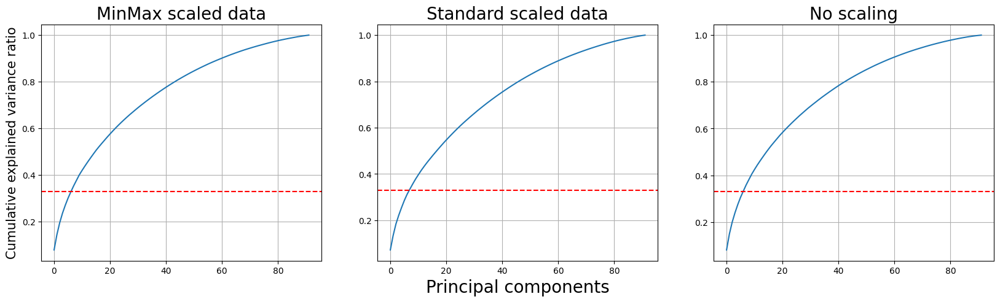

In [114]:

fig,axes = plt.subplots(nrows=1, ncols=3, figsize=(20, 5))
pc_no_scaling = PCA()
pc_no_scaling.fit(X_df.values)
cum_sum_no_scaling = np.cumsum(pc_no_scaling.explained_variance_ratio_)
axes[2].plot(cum_sum_no_scaling, label='No scaling')
axes[2].set_title("No scaling", fontsize=20)
#axes[2].set_xlabel("Principal components")
#axes[2].set_ylabel("Cumulative explained variance ratio")
axes[2].axhline(y=0.33, color='r', linestyle='--', label='33% explained variance')
axes[2].grid()
pc_min_max = PCA()
pc_min_max.fit(Xmm_df.values)
cum_sum_min_max = np.cumsum(pc_min_max.explained_variance_ratio_)
axes[0].plot(cum_sum_min_max, label='MinMax scaled data')
axes[0].set_title("MinMax scaled data", fontsize=20)
#axes[0].set_xlabel("Principal components")
axes[0].set_ylabel("Cumulative explained variance ratio", fontsize=15)
axes[0].axhline(y=0.33, color='r', linestyle='--', label='33% explained variance')
axes[0].grid()

pc_std = PCA()
pc_std.fit(Xstd_df.values)
cum_sum_std = np.cumsum(pc_std.explained_variance_ratio_)
axes[1].plot(cum_sum_std, label='Standard scaled data')
axes[1].axhline(y=0.33, color='r', linestyle='--', label='33% explained variance')
axes[1].set_title("Standard scaled data", fontsize=20)
axes[1].set_xlabel("Principal components", fontsize=20)
#axes[1].set_ylabel("Cumulative explained variance ratio", fontsize=15)
axes[1].grid()



# Comment 
Most of the features already have the same scaling (being almost all of them integers contained in the range 1-5), so the scaling technique does not significantly impact the cumulative explained variance rates per number of principal components in consideration.


## Exercise 3. Dimensionality Reduction and PC Interpretation

In the cells below, do the following operations:
1. For each one of the two dataframes _Xstd_df_, and _Xmm_df_, compute a new PCA for performing a dimensionality reduction with respect to $m$ dimensions. The value of $m$ must be $$m = \min\{m', 5\}\,,$$ where $m'$ is the value required for obtaining $33\%$ of the total variance.
2. For both the cases, visualize all the PCs and give a name/interpretation to them. **Comment and motivate your interpretations**. If possible, **compare the differences among the results obtained** for _Xstd_df_ and _Xmm_df_.
3. Perform the score graph for both the cases (_std_ and _mm_). If $m>3$, plot the score graph with respect to the first 3 PCs. All the **plots must show the names of the PCs on the axes** for better understanding the results.
4. **Optional:** plot more score graphs, coloring the dots with respect to any label in the list _labels_ that you believe can be interesting. **Comment and analyze this optional plots**.

In [50]:
minimum_pc_mm = np.argmax(cum_sum_no_scaling > 0.33333)
minimum_pc_std = np.argmax(cum_sum_std > 0.33333)
print(f"Minimum amout of Principal Components to get 33% of cumulative explained variance:\nMin-Max Scaling:\t{minimum_pc_mm} PCs\nStandard Scaling:\t{minimum_pc_std} PCs")
pc_min_max = PCA(n_components=5)

num_pc_mm = min(minimum_pc_mm, 5)
pca_mm = PCA(n_components=num_pc_mm)
pca_mm.fit(Xmm_df.values)

num_pc_std = min(minimum_pc_std, 5)
pca_std = PCA(n_components=num_pc_std)
pca_std.fit(Xstd_df.values)

print(f"We are using {num_pc_mm} PCs for MinMax scaling and {num_pc_std} PCs for Standard scaling.")


Minimum amout of Principal Components to get 33% of cumulative explained variance:
Min-Max Scaling:	7 PCs
Standard Scaling:	7 PCs
We are using 5 PCs for MinMax scaling and 5 PCs for Standard scaling.


In [51]:
def find_column_type(column_name):
    for type, columns in variables_by_type.items():
        if column_name in columns:
            return type
    return None
def plot_pca_components(pcx, label, only_interesting=False):
    fig, axes = plt.subplots(nrows=(pcx.n_components_ + 1) // 2, ncols=2, figsize=(30, 70), sharey=False)
    
    fig.subplots_adjust(hspace=0.3, wspace=0.5)
    if pcx.n_components_ % 2:
        fig.delaxes(axes[-1, -1])
    for i in range(pcx.n_components_):
        
        ax = axes[i//2, i%2]
        ax.grid()
        ax.set_title(f"PC {i + 1} - {label}", fontsize=40)
        ax.tick_params(axis='y', labelsize=14 if not only_interesting else 20)
        eps = np.sqrt(1/pcx.n_features_in_)
        interesting_columns = np.abs(pcx.components_[i]) > (eps if only_interesting else 0) 
        if only_interesting:
            colors = ['r' if val < 0 else 'g' for val in pcx.components_[i, interesting_columns]]
        else:
            colors = these_types
            ax.axvline(x=eps, color='r')
            ax.axvline(x=-eps, color='r')
        ls = [find_column_type(col) for col in Xmm_df.columns[interesting_columns]]
        unique_types = list(set(ls))
        color_map = {t: plt.cm.tab20(i) for i, t in enumerate(unique_types)}
        colors = [color_map[t] for t in ls]
        handles = [plt.Line2D([0], [0], color=color_map[t], lw=4, label=t) for t in unique_types]
        ax.barh(Xmm_df.columns[interesting_columns], pcx.components_[i, interesting_columns], color=colors)
        ax.legend(handles=handles, fontsize=30)


# Min-Max Scaling

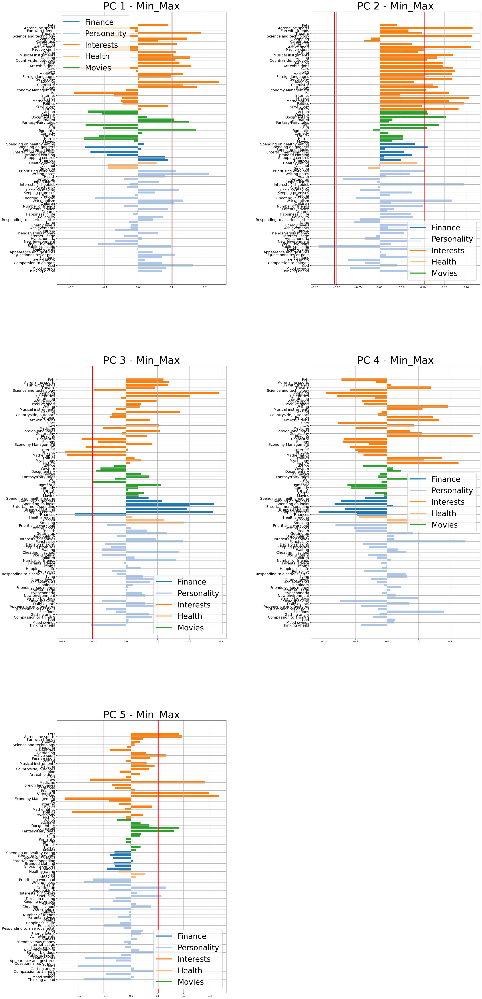

In [52]:
plot_pca_components(pca_mm, "Min_Max", only_interesting=False)

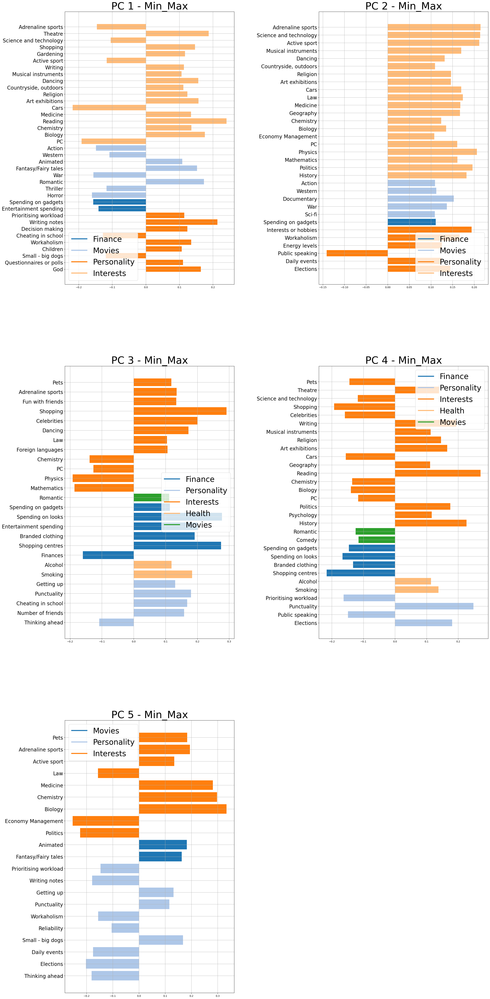

In [53]:
plot_pca_components(pca_mm, "Min_Max", only_interesting=True)

# Standard Scaled Data

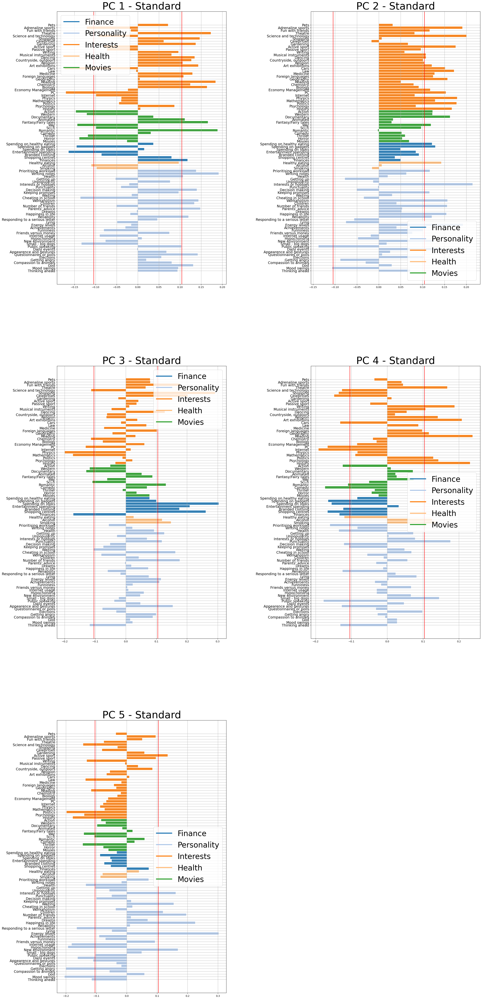

In [54]:
plot_pca_components(pca_std, "Standard", only_interesting=False)

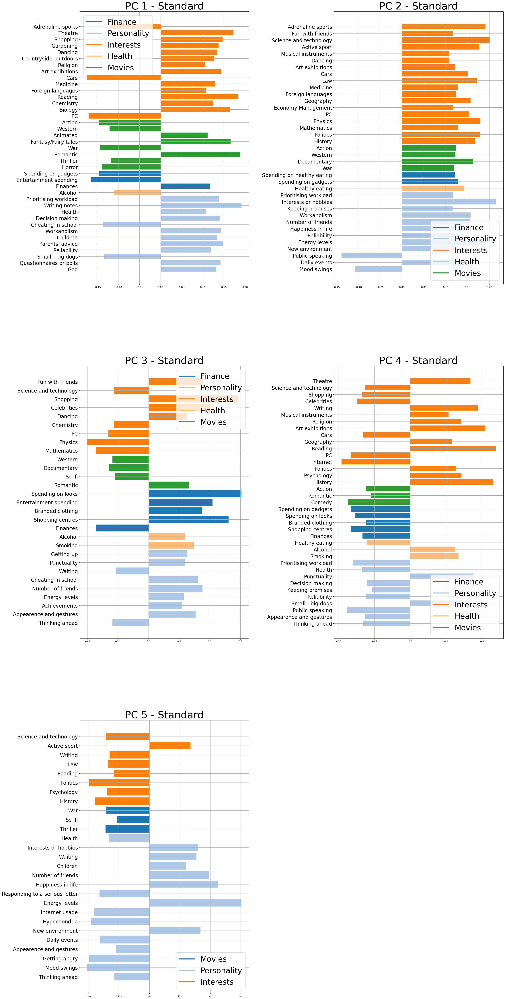

In [55]:
plot_pca_components(pca_std,"Standard", only_interesting=True)

In [56]:
PC_labels_mm = [
    "Responsibile vs. Uncommitted",
    "Culture and Knowledge",
    "Disinhibition and Rebellion",
    "Polite Introvert",
    "Rational vs. Immaginative"
]
PC_labels_std = [
    "Responsibile vs. Uncommitted",
    "Culture and Knowledge",
    "Disinhibition and Rebellion",
    "Studious & Disciplined",
    "Immaginative vs. Rational"
]

# PRINCIPAL COMPONENTS INTEPRETATION

# Min-Max Scaled Data
## PC1 – "Responsible vs. Uncommitted"
**Strong positive contributions:**
- Writing notes
- Prioritizing workload
- Punctuality
- Thinking ahead
- Reliability
- Interest in daily events
- Questionnaires
- Personality traits and some finance variables (e.g., spending control)

**Strong negative contributions:**
- Romantic, fantasy, and action movies
- Entertainment and spontaneous spending

**Interpretation:**  
This component separates organized, reliable, and responsible individuals from those who are more carefree, impulsive, or pleasure-seeking.

---

## PC2 – "Culture and Knowledge"
**Strong positive contributions:**
- Interest in science, technology, medicine, art, history, biology, geography
- Interest in hobbies, work, current events
- Preference for documentaries, historical and war films

**Strong negative contributions:**
- None clearly prominent
**Interpretation:**  
Represents intellectually curious individuals engaged in cultural or scientific activities. 

---

## PC3 – "Disinhibition and Rebellion"
**Strong positive contributions:**
- Smoking
- Alcohol
- Spending on looks and gadgets
- Shopping
- Celebrities
- Romantic and action films
- Financial impulsivity

**Strong negative contributions:**
- Thinking ahead
- Punctuality
- Reliability


**Interpretation:**  
This component distinguishes **impulsive or rebellious individuals** from more contained and rational ones. 

---

## PC4 – "Polite Introvert"
**Strong positive contributions:**
- Interest in psychology, politics, history, and science
- Responsible behaviors: note-taking, punctuality
- Avoidance of bad habits (alcohol, smoking)
- High personal control and social conformity

**Strong negative contributions:**
- Mildly: Reading, religion, geography
**Interpretation:**
A profile of a **serious, mature, well-behaved person**, with few vices and good responsibility management.
---

## PC5 – "Rational vs. Imaginative"
**Strong positive contributions:**
- STEM interests: biology, chemistry, economics, medicine
- Mental order: thinking ahead, reliability, punctuality

**Strong negative contributions:**
- Fantasy and animated movies
- Interest in dogs (both small and big)
- Adrenaline-related activities

**Interpretation:**  
Distinguishes **rational, logic-oriented individuals** from those who are **more playful, imaginative, or emotionally driven.**

---



# STANDARD SCALED DATA


## PC1 – "Responsible vs. Uncommitted" 
**Strong positive contributions:**
- Personality traits: Writing notes, Prioritizing workload, Reliability, Cheating in school (negatively framed trait, but here indicating rule-following), Punctuality, Parental activities
- Religious/spiritual engagement
- Interest in questionnaires and polls
- Avoidance of alcohol and entertainment spending

**Strong negative contributions:**
- Preference for romantic/fantasy movies
- Interest in arts, dancing, adrenaline sports, shopping
- Entertainment and thrill-seeking behaviors

**Interpretation:**  
Matches PC1 from the previous version. Opposes structured, dutiful, and socially responsible individuals against carefree, escapist personalities. 

---

## PC2 – "Culture and Knowledge" 
**Strong positive contributions:**
- Interest in science, medicine, politics, economy, geography, PC, history
- Hobbies, keeping promises, workaholism, reliability
- Number of friends and happiness in life

**Strong negative contributions:**
- Adrenaline sports, musical instruments, partying/fun

**Interpretation:**  
This component again captures a **cultured and rational profile**, leaning toward STEM, responsibility, and social engagement, while rejecting thrill-seeking and chaotic behaviors. **Same as before: "Culture and Knowledge."**

---

## PC3 – "Disinhibition and Rebellion" 
**Strong positive contributions:**
- Alcohol, smoking, spending on looks, branded clothing
- Preference for celebrity culture, romantic/western/sci-fi genres
- Impulsivity traits: skipping school, being late, low punctuality

**Strong negative contributions:**
- Thinking ahead, reliability, achievements, low cheating in school

**Interpretation:**  
Again distinguishes rule-breakers and impulsive individuals from self-disciplined ones. Clear parallel to earlier **PC3: "Disinhibition and Rebellion."**

---

## PC4 – "Studious and Disciplined"   
**Strong positive contributions:**
- Reading, history, psychology, politics, religion
- Punctuality, decision-making, avoiding vices (no smoking or alcohol)
- Spending less on fashion and branding

**Strong negative contributions:**
- Shopping, celebrities, art exhibitions, dancing

**🎓 Interpretation:**  
This is a refined and more behavioral version of **PC4 from the previous set**. Suggests intellectual, conscientious youth who avoid mainstream distractions and vices.  
**Best labeled: "Well-behaved Youth."**

---

## PC5 – "Immaginative vs Rational" *(inverted version of earlier PC5)*  
**Strong positive contributions:**
- Mood swings, hypochondria, concern for appearance, getting angry
- High empathy and hypersensitivity traits (e.g., writing, interest in others, responding to serious letters)
- Internet use and social withdrawal markers
- Preference for thrillers and war movies (coping or escape?)

**Strong negative contributions:**
- STEM interest (very mild), thinking ahead

**Interpretation:**  
This may be the **inverted version** of the previous PC5. While earlier it captured rational/logical thinkers, this one highlights **emotional vulnerability and hypersensitivity**. 

---
---

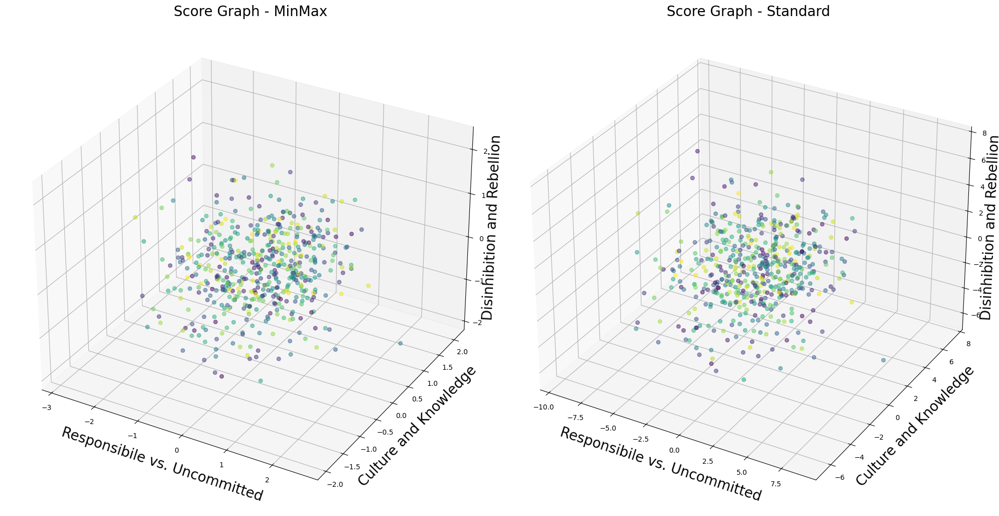

In [92]:
# plot score graph of the first 3 PCs 
fig, axes = plt.subplots(figsize=(20, 20
                            ), subplot_kw={'projection': '3d'}, nrows=1, ncols=2)
for x, ax, title, pc_labels in zip((Xmm_df, Xstd_df), axes, ("MinMax", "Standard"), (PC_labels_mm, PC_labels_std)):
    transformed = PCA(n_components=3).fit_transform(x.values)
    ax.scatter(transformed[:, 0], transformed[:, 1], transformed[:, 2], c=range(transformed[:].shape[0]), s=30, alpha=0.5)
    ax.set_xlabel(pc_labels[0], fontsize=20, labelpad=10, rotation=-20)
    ax.set_ylabel(pc_labels[1], fontsize=20, labelpad=10, rotation=50)
    ax.set_zlabel(pc_labels[2], fontsize=20, labelpad= 0, rotation=90)
    ax.grid()
    ax.set_title(f'Score Graph - {title}', fontsize=20)
plt.tight_layout()

plt.show()


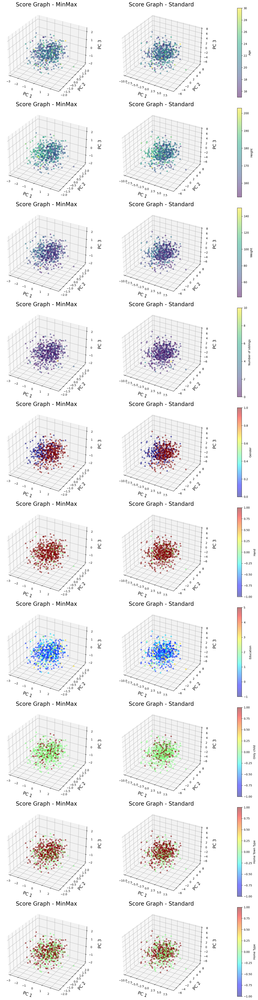

In [58]:
# Compare the PCA results to the labels by making a scatter plot of the first three PCs with a color map of the labels
# i want to use the age as a color map
# and then to also print the colorbar
from matplotlib import cm
fig, axes = plt.subplots(figsize=(15, 50), subplot_kw={'projection': '3d'}, nrows=len(labels), ncols=2)
X_labels_df = responses_df.iloc[X_df.index][labels]
#Encode al the labels that are categorical
X_labels_df = X_labels_df.apply(lambda x: pd.factorize(x)[0] if x.dtype == 'object' else x)
for label, row in zip(labels, range(len(labels))):
    for x, ax, title in zip((Xmm_df, Xstd_df), axes[row], ("MinMax", "Standard")):
        transformed = PCA(n_components=3).fit_transform(x.values)
        scatterPlot = ax.scatter(transformed[:, 0], transformed[:, 1], transformed[:, 2], c=X_labels_df[label], cmap=('viridis'if X_labels_df[label].dtype == 'float64' else cm.jet), alpha=0.5)
        ax.set_xlabel('PC 1', fontsize=15, labelpad=10, rotation=-20)
        ax.set_ylabel('PC 2', fontsize=15, labelpad=10, rotation=50)
        ax.set_zlabel('PC 3', fontsize=15, labelpad=10, rotation=90)
        ax.grid()
        ax.set_title(f'Score Graph - {title}', fontsize=20)
    fig.colorbar(scatterPlot, label=label,ax=ax, pad=0.2)
plt.tight_layout()

plt.show()



The main objective was to investigate whether **demographic or physical variables** (such as gender, education level, or being an only child) were associated with **patterns revealed by PCA**. However, the plots do not show clear separations or distinct clusters based on these variables. The only noteworthy observations are:

* **Gender appears to be the only variable with a partially non-random distribution**: in components such as PC, there is a visible concentration of male individuals in specific areas of the component space, potentially linked to differences in responses. Height and weight distributions also vary consistently with gender;

* **Education level does not show any meaningful pattern** in relation to the principal components. Individuals with both high and low education levels are spread evenly across the PCA space, suggesting that **education has little to no influence on the structure revealed by the analysis**;

* **Being an only child does not produce any distinguishable clustering or separation**. Individuals who are only children and those with siblings appear evenly distributed, with no evident concentration or structure linked to this variable. Therefore, **no association between being an only child and the principal components is observed**.




## Exercise 4. $k$-Means

In the cells below, do the following operations:
1. For each one of the two datasets (_std_ and _mm_), run the $k$-Means for clustering the data. In particular, **use the silohuette score for identify the best value for $k\in\{3, \ldots, 10\}$**.
2. Plot the score graphs of exercise 3.3, adding the centroids of the cluster.
3. Observing the centroids coordinates in the PC space, **give a name/interpretation to them**, exploiting the names you assigned to the PCs. **Comment and motivate your interpretations**.

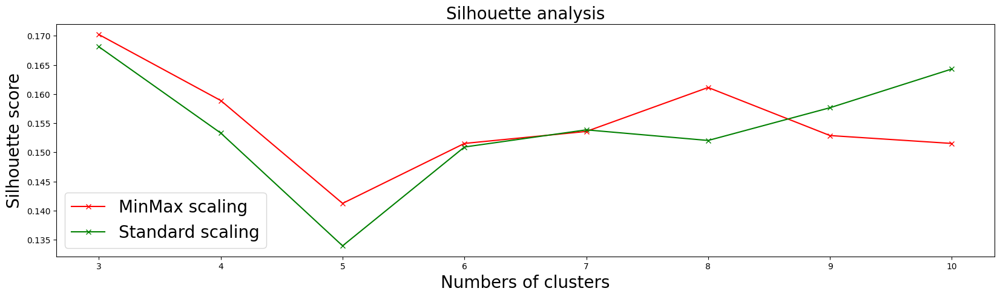

In [85]:

from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
fig, ax = plt.subplots(figsize=(20, 5), nrows=1, ncols=1)
for transformed, color, label in zip((pca_mm.transform(Xmm_df.values), pca_std.transform(Xstd_df.values)), ("red", "green"), ("MinMax", "Standard")):
    range_n_clusters = list(range(3, 11))
    silhouette_avg = []
    for num_clusters in range_n_clusters:
        # initialise kmeans
        kmeans = KMeans(n_clusters=num_clusters, random_state=random_seed)
        kmeans.fit(transformed)
        cluster_labels = kmeans.labels_
        
        
        # silhouette score
        silhouette_avg.append(silhouette_score(transformed, cluster_labels, random_state=random_seed))

    ax.plot(range_n_clusters, silhouette_avg, 'x-', color=color, label=f'{label} scaling')
    ax.legend(fontsize=20)
    ax.set_xticks(range_n_clusters)
    ax.set_xlabel('Numbers of clusters', fontsize=20) 
    ax.set_ylabel('Silhouette score', fontsize=20) 
    ax.set_title(f'Silhouette analysis',fontsize=20)
    ax.grid()



# Comment 
The silhouette scores in the graph are generally very low, considering that to have a good clustering, we should typically observe silhouette scores of at least 0.5 or higher. Scores closer to 1 indicate well-separated and dense clusters, while scores near 0 suggest overlapping clusters, and negative values imply incorrect clustering.

In this case, the silhouette scores remain below 0.17, indicating that the clustering structure is not very strong, likely due to information loss during dimensionality reduction. Despite this, the best scores occur for K = 3, which is why we chose it as the optimal number of clusters.

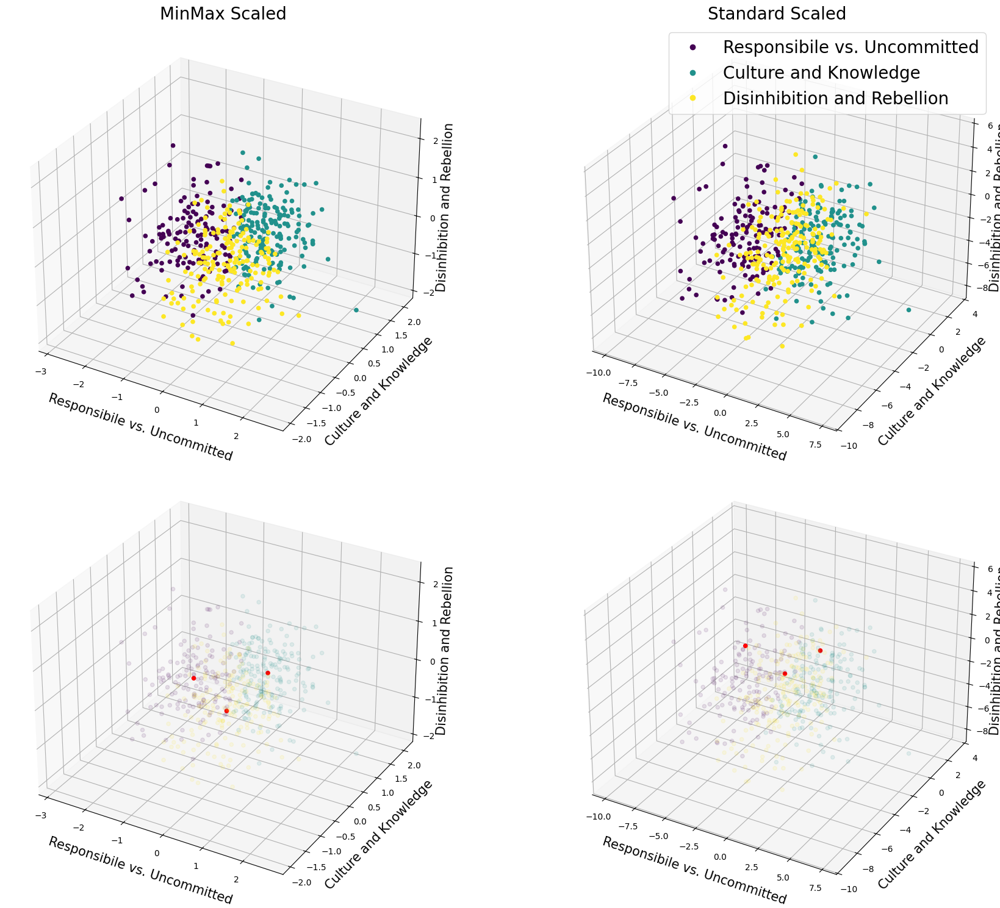

In [84]:
km = KMeans(n_clusters=3, random_state=random_seed)
labels_km = km.fit_predict(transformed)
fig, axes = plt.subplots(figsize=(20, 15), nrows=2, ncols=2, subplot_kw={'projection': '3d'})
for x, ax, title, PC_labels in zip((Xmm_df, Xstd_df), axes[0], ("MinMax", "Standard"), (PC_labels_mm, PC_labels_std)):
    transformed = pca_mm.transform(x.values)
    labels_km = km.fit_predict(transformed)

    scatter_plot = ax.scatter(transformed[:,0], transformed[:,1], transformed[:,2], c=labels_km, alpha=1)
    ax.set_xlabel(PC_labels[0], fontsize=15, labelpad=10, rotation=-20)
    ax.set_ylabel(PC_labels[1], fontsize=15, labelpad=10, rotation=50)
    ax.set_zlabel(PC_labels[2], fontsize=15, labelpad= 0, rotation=90)
    ax.set_title(f"{title} Scaled",fontsize=20)
    # add legend of the labels colors 
ax.legend(scatter_plot.legend_elements()[0], PC_labels[:3], fontsize=20)

for x, ax, title, PC_labels in zip((Xmm_df, Xstd_df), axes[1], ("MinMax", "Standard"), (PC_labels_mm, PC_labels_std)):
    transformed = pca_mm.transform(x.values)
    labels_km = km.fit_predict(transformed)

    ax.scatter(transformed[:,0], transformed[:,1], transformed[:,2], c=labels_km, alpha=0.1)
    ax.set_xlabel(PC_labels[0],     fontsize=15, labelpad=10, rotation=-20)
    ax.set_ylabel(PC_labels[1], fontsize=15, labelpad=10, rotation=50)
    ax.set_zlabel(PC_labels[2], fontsize=15, labelpad= 0, rotation=90)
    ax.scatter(km.cluster_centers_[:,0], km.cluster_centers_[:,1], km.cluster_centers_[:,3], c='red', alpha=1)
plt.tight_layout()

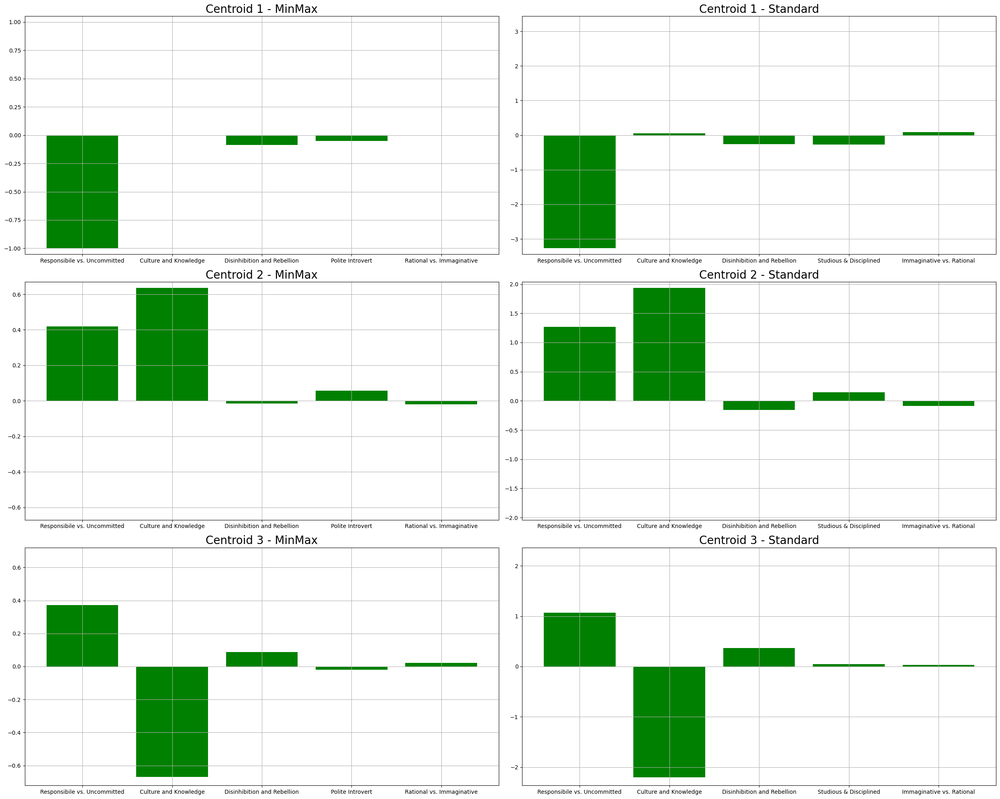

In [83]:
# Plot only centroids positions using bar plot
fig, axes = plt.subplots(figsize=(25, 20), nrows=3, ncols=2)

# KMeans models
km_mm = KMeans(n_clusters=3, random_state=random_seed)
km_std = KMeans(n_clusters=3, random_state=random_seed)

# PCA transformations
y_mm = pca_mm.fit_transform(Xmm_df.values)
y_std = pca_std.fit_transform(Xstd_df.values)

# Fit KMeans
km_mm.fit(y_mm)
km_std.fit(y_std)

# Plotting
for j, (km, y, PC_labels, title) in enumerate(zip(
    (km_mm, km_std),
    (y_mm, y_std),
    (PC_labels_mm, PC_labels_std),
    ("MinMax", "Standard")
)):
    for i, centers in enumerate(km.cluster_centers_):
        axes[i][j].set_title(f"Centroid {i+1} - {title}", fontsize=20)
        axes[i][j].bar(PC_labels, centers, color='green')
        axes[i][j].grid()

        yabs_max = abs(max(axes[i][j].get_ylim(), key=abs))
        axes[i][j].set_ylim(ymin=-yabs_max, ymax=yabs_max)

        #axes[i][j].bar(PC_labels, y.max(axis=0), color='blue')
        #axes[i][j].bar(PC_labels, y.min(axis=0), color='blue')
# Layout adjustment
fig.tight_layout()




The bar plots show that for both MinMax and Standard scaled data, the first three Principal Components (PCs) have the strongest influence on the cluster centroids. Since the patterns for corresponding PCs (like PC1-MinMax compared to PC1-Standard) are very similar across both scaling methods, the interpretation of the clusters remains consistent for both.

### Clusters Interpretations:

- **Cluster 1**:   People who focus on entertainment, arts, exciting activities, and popular social events. They might not always be very responsible or the quiet, "good" type, but they generally don't go around breaking rules. They have some interest in cultural things and are sensitive to their own and others' feelings.
- **Cluster 2**:  Very responsible people who are interested in culture and know a lot. They have good self-control, value learning and thinking things through, do tasks carefully, and are usually emotionally calm and steady.
- **Cluester 3**:  People not very interested in common cultural or learning activities (like science or politics). They often look for excitement and might act out, but they still manage to be responsible in some areas. They also show signs of being a bit quiet or studious at times, alongside being emotionally sensitive (which might mean they sometimes feel fearful or find things hard).

## Exercise 5. Cluster Evaluations

In the cells below, do the following operations:
1. For each one of the two datasets (_std_ and _mm_), perform an **external evaluation** of the clustering obtained at exercise 4.1 with respect to one or more labels in the list _labels_. **Comment the results, comparing the evaluation with the interpretation you gave at exercise 4.3**. 
2. For each one of the two datasets (_std_ and _mm_), perform an **internal evaluation** of each cluster, with respect to the silohuette score. **Comment the results**. 

# External Evaluation

In [62]:
from sklearn import metrics
import pandas as pd

# Copy the labels from responses_df for the same index as X_df
L_df = responses_df.loc[X_df.index, labels].dropna()

# Create DataFrames for cluster labels from the two models
km_std_df = pd.DataFrame({"Cluster": km_std.labels_}, index=X_df.index)
km_mm_df = pd.DataFrame({"Cluster": km_mm.labels_}, index=X_df.index)

# Compute ARS for each label in L_df vs both clusterings
ars_scores = pd.DataFrame(
    {
        "Standardized": [
            metrics.adjusted_rand_score(L_df[label], km_std_df["Cluster"].loc[L_df.index])
            for label in L_df.columns
        ],
        "Min-Max Scaled": [
            metrics.adjusted_rand_score(L_df[label], km_mm_df["Cluster"].loc[L_df.index])
            for label in L_df.columns
        ],
    },
    index=L_df.columns
)

# Display the resulting dataframe
display(ars_scores)


,Standardized,Min-Max Scaled
Age,-0.002481,-0.002690
Height,0.014493,0.014787
Weight,0.006586,0.007704
Number of siblings,-0.003343,0.000113
Gender,0.242676,0.248065
Hand,-0.000347,0.000623
Education,-0.000886,-0.000990
Only child,-0.002887,-0.001276
Home Town Type,-0.001520,-0.001903
Home Type,-0.001503,0.001171



To externally evaluate the clustering performance, we computed the **Adjusted Rand Score** (ARS). ARS measures the similarity between two clustering assignments by considering all pairs of samples and determining whether they are assigned to the same or different clusters in both the predicted and true labels. It adjusts for chance, with a score close to 1 indicating high similarity and a score near 0 suggesting a random or uninformative clustering.

As shown in the table above, the ARS values are very low for most features, indicating weak alignment between the clustering and the actual labels. However, the Gender feature stands out with a significantly higher ARS (0.242676 for standardized data and 0.248065 for min-max scaled data), suggesting that the clustering algorithm may have partially captured patterns related to gender. This observation is further supported by the scatter plot below: most individuals in the third cluster (represented by a star) are male, whereas those in the other clusters are predominantly female.

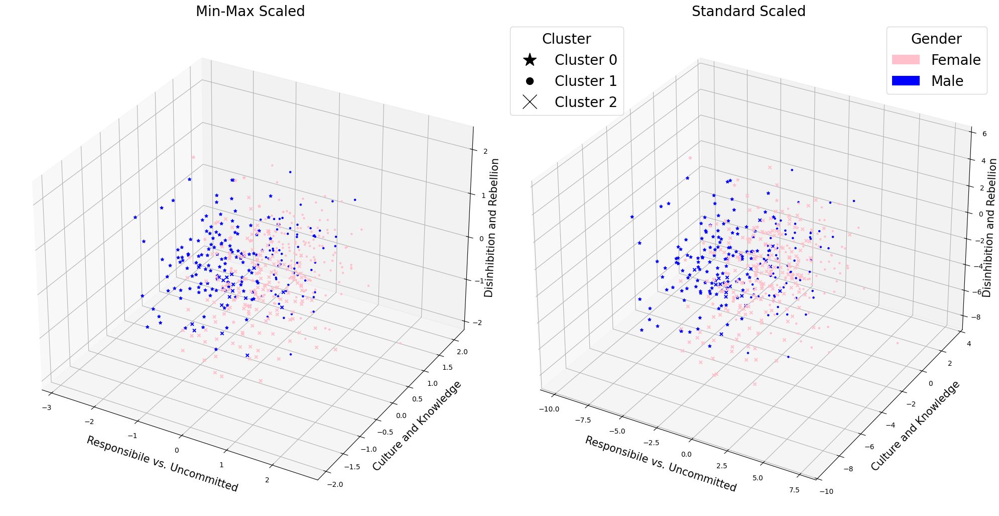

In [82]:
from matplotlib.patches import Patch
from matplotlib.lines import Line2D
L_df = responses_df.loc[X_df.index, labels]
# plot score graipgh coloring by gender label
color_map = {"male": "blue", "female": "pink"}
gender_label =  L_df["Gender"].map(lambda a: color_map[a])


fig, axes = plt.subplots(figsize=(20, 15), nrows=1, ncols=2, subplot_kw={'projection': '3d'})
for x, ax, title, PC_labels in zip((Xmm_df, Xstd_df), axes, ("Min-Max", "Standard"), (PC_labels_mm, PC_labels_std)):
    km = KMeans(n_clusters=3, random_state=random_seed)
    transformed = pca_mm.transform(x.values)
    labels_km = km.fit_predict(transformed)

    for i in range(km.n_clusters):
        scatter_plot = ax.scatter(transformed[:,0][labels_km==i], transformed[:,1][labels_km==i], transformed[:,2][labels_km==i], c=gender_label[labels_km==i], marker=["*", ".", "x"][i], alpha=1)
    ax.set_xlabel(PC_labels[0], fontsize=15, labelpad=10, rotation=-20)
    ax.set_ylabel(PC_labels[1], fontsize=15, labelpad=10, rotation=50)
    ax.set_zlabel(PC_labels[2], fontsize=15, labelpad= 0, rotation=90)
    ax.set_title(f"{title} Scaled", fontsize=20)
    # add legend of the labels colors 

legend_elements = [
    Patch(facecolor='pink', label='Female'),
    Patch(facecolor='blue', label='Male')
]
cluster_legend = [
    Line2D([0], [0], color='black', marker='*', linestyle='None', label='Cluster 0', ms=20),
    Line2D([0], [0], color='black', marker='.', linestyle='None', label='Cluster 1', ms=20),
    Line2D([0], [0], color='black', marker='x', linestyle='None', label='Cluster 2', ms=20)
]

legend_cluster = plt.legend(handles=cluster_legend, title='Cluster', loc='upper left', fontsize=20, title_fontsize=20)
plt.gca().add_artist(legend_cluster)
ax.legend(handles=legend_elements, title='Gender', title_fontsize=20, fontsize=20)

plt.tight_layout()



In [67]:
scatter_plot.legend_elements()[0]

# External Evaluation

In [ ]:
# compute siluhette score on the kmeans clusters
df = pd.DataFrame()
for y, km, name in zip((y_mm, y_std), (km_mm, km_std), ("Min-Max", "Std")):
    df[name] = [ silhouette_score(y_mm, km_mm.labels_ == i) for i in range(km_mm.n_clusters)] + [silhouette_score(y_mm, km.labels_)]
df.index = ([f"Cluster {i + 1}" for i in range(km_mm.n_clusters)] + ["Global silhouette score"])
display(df)

,Min-Max,Std
Cluster 1,0.176086,0.176086
Cluster 2,0.140832,0.140832
Cluster 3,0.127748,0.127748
Global silhouette score,0.170208,0.165667


### Comment

The low silhouette scores show that the clusters are not very well separated or clearly defined. Overall, this is not a good clustering result.


At first, it might seem like the problem is caused by things like too many dimensions or clusters with different shapes and sizes. However, that’s not likely the case here, since the data was reduced to just five main components, and the points are fairly evenly spread out in a round shape. The more likely reason is that these components don’t explain enough of the total variation in the data. This means that important information might have been lost, and the features used don’t strongly relate to the demographic factors being studied.